

1.   https://hub.hitplayer.ru/?s=crim3s
2.   Новый пункт



# Installation and imports


In [1]:
!pip install optuna
!pip install librosa
!pip install eli5
!pip install catboost
!pip install tensorflow
!pip install joblib
!pip install scipy
!pip install h5py scikit-optimize

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 348 kB 16.2 MB/s 
     |████████████████████████████████| 209 kB 58.8 MB/s 
     |████████████████████████████████| 81 kB 9.9 MB/s 
     |████████████████████████████████| 78 kB 8.5 MB/s 
     |████████████████████████████████| 147 kB 76.0 MB/s 
     |████████████████████████████████| 112 kB 72.0 MB/s 
     |████████████████████████████████| 50 kB 8.3 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=cebe28a1be88e34d5eff7a79e40e4031698119a0fc97595f6108d08a4a7a8e02
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |█████

In [ ]:
import os
import time

import librosa
from librosa.core.audio import zero_crossings
import librosa.display

import optuna

import numpy as np

import json

from sklearn.metrics import classification_report

import IPython.display as ipd

%matplotlib inline
import matplotlib.pyplot as plt

import joblib

import sklearn
from sklearn.model_selection import KFold
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import make_scorer , mean_squared_error, confusion_matrix, accuracy_score, roc_auc_score, roc_curve, classification_report
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import GridSearchCV

# Skopt functions
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, DeltaYStopper,VerboseCallback,DeltaXStopper
from skopt.space import Real, Categorical, Integer


from PIL import Image

import pathlib

import csv

from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance

from tensorflow.keras.callbacks import ReduceLROnPlateau,EarlyStopping,ModelCheckpoint,LearningRateScheduler
import tensorflow.keras as keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import *

from xgboost import plot_importance

import catboost as cb
from catboost import CatBoostError

import eli5
from eli5.sklearn import PermutationImportance

import pandas as pd

import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [ ]:
genres_to_analyze = (list(os.listdir(f'/content/drive/MyDrive/Colab Notebooks/ML/Course Work/Genres')))

In [ ]:
genres_to_analyze

#Analysing samples

In [ ]:
audio_file="/content/drive/MyDrive/Colab Notebooks/ML/Course Work/Genres/lo-fi/al-90-vectornaya-eyforia.mp3"
x, sr = librosa.load(audio_file)

print (type(x), type(sr))

print(x.shape, sr)

#This returns an audio time series as a numpy array with a default sampling rate(sr) of 22KHZ mono.

<class 'numpy.ndarray'> <class 'int'>
(6202162,) 22050


In [ ]:
ipd.Audio(audio_file)

We can plot the audio array using librosa.display.waveplot:

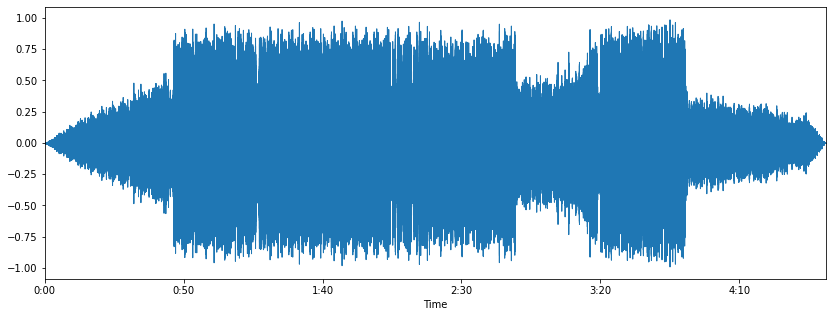

In [ ]:
plt.figure(figsize=(14,5))
librosa.display.waveplot(x, sr=sr)



##Zero Crossing Rate

The zero crossing rate is the rate of sign-changes along a signal, i.e., the rate at which the signal changes from positive to negative or back. This feature has been used heavily in both speech recognition and music information retrieval. It usually has higher values for highly percussive sounds like those in metal and rock.
Let us calculate the zero crossing rate for our example audio clip.

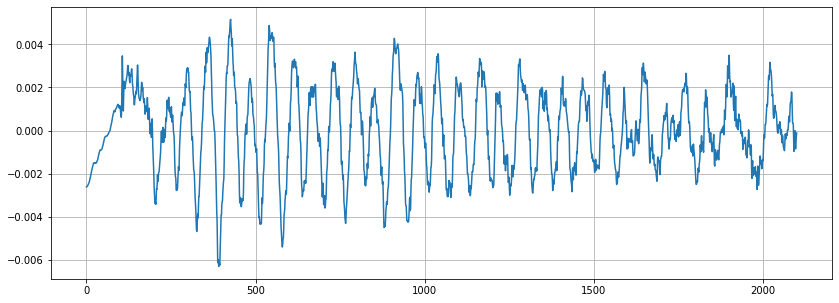

In [ ]:
n0 = 7000
n1 = 9100 

plt.figure(figsize=(14,5))
plt.plot(x[n0:n1])
plt.grid()

Let's count number of zero crossings

In [ ]:
crossings_0 = zero_crossings(x[n0:n1], pad=False)
print(sum(crossings_0))

110


##Spectrogram

A spectrogram is a visual representation of the spectrum of frequencies of sound or other signals as they vary with time. Spectrograms are sometimes called sonographs, voiceprints, or voicegrams. When the data is represented in a 3D plot, they may be called waterfalls. In 2-dimensional arrays, the first axis is frequency while the second axis is time.
We can display a spectrogram using. librosa.display.specshow.

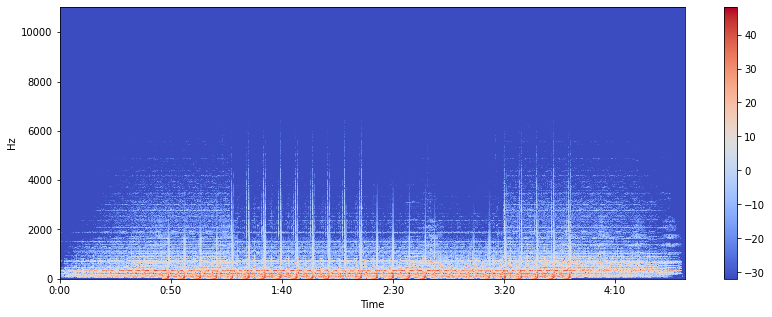

In [ ]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))

plt.figure(figsize=(14,5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()


The vertical axis shows frequencies (from 0 to 10kHz), and the horizontal axis shows the time of the clip. Since we see that all action is taking place at the bottom of the spectrum, we can convert the frequency axis to a logarithmic one.

KeyboardInterrupt: ignored

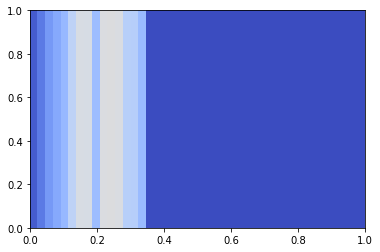

In [ ]:
librosa.display.specshow(Xdb,sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

##Spectral Centroid

It indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound. Consider two songs, one from a blues genre and the other belonging to metal. Now as compared to the blues genre song which is the same throughout its length, the metal song has more frequencies towards the end. So spectral centroid for blues song will lie somewhere near the middle of its spectrum while that for a metal song would be towards its end.
librosa.feature.spectral_centroid computes the spectral centroid for each frame in a signal:

In [ ]:
%%time
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
print(spectral_centroids.shape)

#Computing the time variable for Visualisation
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

#Normalising the spectral centroid for Visualisation
def normalise(x, axis=0):
  return sklearn.preprocessing.minmax_scale(x, axis=axis)

#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalise(spectral_centroids), color='r')


There is a rise in the spectral centroid towards the end.

##Spectral Rolloff

It is a measure of the shape of the signal. It represents the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies.
librosa.feature.spectral_rolloff computes the rolloff frequency for each frame in a signal:

In [ ]:
spectral_rolloff= librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalise(spectral_rolloff), color='r')


##Mel-Frequency Cepstral Coefficients

The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.
Let’ work with a simple loop wave this time.

librosa.feature.mfcc computes MFCCs across an audio signal:

In [ ]:
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)

#Display mfcc
librosa.display.specshow(mfccs,sr=sr, x_axis='time')

In [ ]:
%%time
# Here mfcc computed 20 MFCC s over 97 frames.
# We can also perform feature scaling such that each coefficient dimension has zero mean and unit variance:

mfccs=sklearn.preprocessing.scale(mfccs, axis=1)
print(mfccs.mean(axis=1))
print(mfccs.var(axis=1))

librosa.display.specshow(mfccs, sr=sr, x_axis='time')

##Chroma Frequencies

Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chroma) of the musical octave.
librosa.feature.chroma_stft is used for computation

In [ ]:
hop_length=1024
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(14,5))
librosa.display.specshow(chromagram, x_axis="time", y_axis='chroma', hop_length=hop_length, cmap='coolwarm')

##Creating an audio signal

Let us now create an audio signal at 220Hz. An audio signal is a numpy array, so we shall create one and pass it into the audio function.

In [ ]:
sr = 22050 #sample rate
T = 5.0 #seconds
squeek_meter=5 #(you can change this variable to a higher value to make it sound more "high")
t= np.linspace(0, T, int(T*sr), endpoint=False) # time variable
x = 0.5*np.sin(squeek_meter*np.pi*220*t)# pure sinusoid wave at 220HZ

#Playing the audio
ipd.Audio(x,rate=sr)

#To save audio
#librosa.output.write_wave('Some_song_name.wav', x, sr)

##Next few big steps

Попробуем воспользоваться датасетом GTZAN для того, чтобы обучить модель


In [ ]:
general_path = '/content/drive/MyDrive/Colab Notebooks/ML/Course Work/Data'
print(list(os.listdir(f'{general_path}/genres_original/')))

In [ ]:
y, sr = librosa.load(f'{general_path}/genres_original/reggae/reggae.00036.wav')

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# Verify length of the audio
print('Check Len of Audio:', 661794/22050)

In [ ]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file, _ = librosa.effects.trim(y)

# the result is an numpy ndarray
print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))

In [ ]:
plt.figure(figsize = (16, 6))
librosa.display.waveplot(y = audio_file, sr = sr, color = "#A300F9");
plt.title("Sound Waves in Reggae 36", fontsize = 23);

In [ ]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(audio_file, n_fft = n_fft, hop_length = hop_length))

print('Shape of D object:', np.shape(D))

In [ ]:
plt.figure(figsize = (16, 6))
plt.plot(D);

##Harmonics and Perceptrual and tempo

Harmonics are characteristichs that human years can't distinguish (represents the sound color)
Perceptrual understanding shock wave represents the sound rhythm and emotion

Dynamic programming beat tracker.

In [ ]:
y_harm, y_perc = librosa.effects.hpss(audio_file)

plt.figure(figsize = (16, 6))
plt.plot(y_harm, color = '#A300F9');
plt.plot(y_perc, color = '#FFB100');

tempo, _ = librosa.beat.beat_track(y, sr = sr)
tempo

##EDA

EDA is going to be performed on the features_30_sec.csv. This file contains the mean and variance for each audio file fo the features analysed above.

So, the table has a final of 1000 rows (10 genrex x 100 audio files) and 60 features (dimensionalities).

In [ ]:
data = pd.read_csv(f'{general_path}/features_30_sec.csv')
data.head()

In [ ]:
#Correlation Heatmap for feature means

# Computing the Correlation Matrix
spike_cols = [col for col in data.columns if 'mean' in col]
corr = data[spike_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11));

# Generate a custom diverging colormap
cmap = sns.diverging_palette(0, 25, as_cmap=True, s = 90, l = 45, n = 5)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap (for the MEAN variables)', fontsize = 25)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)
plt.savefig("Corr Heatmap.jpg")

##Box Plot for Genres Distributions

In [ ]:
x = data[["label", "tempo"]]

f, ax = plt.subplots(figsize=(16, 9));
sns.boxplot(x = "label", y = "tempo", data = x, palette = 'husl');

plt.title('BPM Boxplot for Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)
plt.savefig("BPM Boxplot.jpg")

Principal Component Analysis - to visualize possible groups of genres:

Normalization

PCA - метод главных компонент

The Scatter Plot

In [ ]:
data = data.iloc[0:, 1:]
y = data['label']
X = data.loc[:, data.columns != 'label']

#### NORMALIZE X ####
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)


#### PCA 2 COMPONENTS ####

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

# concatenate with target label
finalDf = pd.concat([principalDf, y], axis = 1)

print(pca.explained_variance_ratio_)

plt.figure(figsize = (16, 9))
sns.scatterplot(x = "principal component 1", y = "principal component 2", data = finalDf, hue = "label", alpha = 0.7,
               s = 100);

plt.title('PCA on Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Principal Component 1", fontsize = 15)
plt.ylabel("Principal Component 2", fontsize = 15)
plt.savefig("PCA Scattert.jpg")

#Machine learning ?

Теперь мы будем использовать машинное обучение для всего этого дела

In [ ]:
data = pd.read_csv(f'{general_path}/features_3_sec.csv')
data = data.iloc[0:, 1:] 
data.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


##Features and Target variable

creates the target and feature variables
normalizes the data

In [ ]:
y = data['label'] # genre variable.
X = data.loc[:, data.columns != 'label'] #select all columns but not the labels

#### NORMALIZE X ####

# Normalize so everything is on the same scale. 

cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)

# new data frame with the new scaled data. 
X = pd.DataFrame(np_scaled, columns = cols)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


##Creating a Predefined function to assess the accuracy of a model

input is the model

fits the model on the training dataset

predicts on the testing features

compares the predictions with the actuals

In [ ]:
def model_assess(model, title = "Default"):
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    #print(confusion_matrix(y_test, preds))
    print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')

In [ ]:
%%time
# Naive Bayes
nb = GaussianNB()
model_assess(nb, "Naive Bayes")

Accuracy Naive Bayes : 0.51952 

CPU times: user 28 ms, sys: 2.01 ms, total: 30.1 ms
Wall time: 29.4 ms


In [ ]:
%%time
# Stochastic Gradient Descent
sgd = SGDClassifier(max_iter=5000, random_state=0)
model_assess(sgd, "Stochastic Gradient Descent")

Accuracy Stochastic Gradient Descent : 0.65532 

CPU times: user 362 ms, sys: 1.74 ms, total: 364 ms
Wall time: 356 ms


In [ ]:
%%time
# KNN
knn = KNeighborsClassifier(n_neighbors=19)
model_assess(knn, "KNN")

Accuracy KNN : 0.80581 

CPU times: user 658 ms, sys: 113 ms, total: 771 ms
Wall time: 566 ms


In [ ]:
%%time
# Decission trees
tree = DecisionTreeClassifier()
model_assess(tree, "Decission trees")

Accuracy Decission trees : 0.64431 

CPU times: user 585 ms, sys: 1.78 ms, total: 586 ms
Wall time: 581 ms


In [ ]:
%%time
# Random Forest
rforest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
model_assess(rforest, "Random Forest")

Accuracy Random Forest : 0.81415 

CPU times: user 33.6 s, sys: 30.9 ms, total: 33.7 s
Wall time: 33.7 s


In [ ]:
%%time
# catboost
cbc = cb.CatBoostClassifier(verbose=0, eval_metric='Accuracy', loss_function='MultiClass')
model_assess(cbc,"Cat Boost Classifier")

Accuracy Cat Boost Classifier : 0.91124 

CPU times: user 3min 27s, sys: 764 ms, total: 3min 28s
Wall time: 1min 47s


In [ ]:
%%time
# Support Vector Machine
svm = SVC(decision_function_shape="ovo")
model_assess(svm, "Support Vector Machine")

In [ ]:
%%time
# Logistic Regression
lg = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial')
model_assess(lg, "Logistic Regression")

In [ ]:
%%time
# Neural Nets
nn = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5000, 10), random_state=1)
model_assess(nn, "Neural Nets")

In [ ]:
%%time
# Cross Gradient Booster
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
model_assess(xgb, "Cross Gradient Booster")

In [ ]:
%%time
# Cross Gradient Booster (Random Forest)
xgbrf = XGBRFClassifier(objective= 'multi:softmax')
model_assess(xgbrf, "Cross Gradient Booster (Random Forest)")

In [ ]:
#One more way to check, that our XGBoost will work perfectly
%%time
model = XGBClassifier(n_estimators=1000)
model.fit(X_train,y_train,eval_metric='merror')

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
target_names = sorted(set(y))

print(f'Training accuracy: {accuracy_score(y_train,y_pred_train)}')
print(f'Training:\n {classification_report(y_train, y_pred_train, labels=target_names)}')
print(f'Testing accuracy: {accuracy_score(y_test,y_pred_test)}')
print(f'Testing:\n {classification_report(y_test, y_pred_test, labels=target_names)}')

XGBoost is the winner - 90% accuracy

create the final model

compute confusion matrix

Compute Feature Importance

In [ ]:
# Final model
%%time
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
xgb.fit(X_train, y_train)

preds = xgb.predict(X_test)

print('Accuracy', ':', round(accuracy_score(y_test, preds), 5), '\n')

# Confusion Matrix
confusion_matr = confusion_matrix(y_test, preds) #normalize = 'true'
plt.figure(figsize = (16, 9))
sns.heatmap(confusion_matr, cmap="Blues", annot=True, 
            xticklabels = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"],
           yticklabels=["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]);
plt.savefig("conf matrix")

In [ ]:
%%time
perm = PermutationImportance(estimator=xgb, random_state=1)
perm.fit(X_test, y_test)

eli5.show_weights(estimator=perm, feature_names = X_test.columns.tolist())

CPU times: user 9min 56s, sys: 209 ms, total: 9min 56s
Wall time: 9min 56s


#Recommender Systems

"Recomender" Systems enable us for any given vector to find the best similarity, ranked in descending order, from the bast match to the least best match.

For Audio files, this will be done through cosine_similarity library.

In [ ]:
# Read data
data = pd.read_csv(f'{general_path}/features_30_sec.csv', index_col='filename')

# Extract labels
labels = data[['label']]

# Drop labels from original dataframe
data = data.drop(columns=['length','label'])
data.head()

# Scale the data
data_scaled=preprocessing.scale(data)
print('Scaled data type:', type(data_scaled))

Scaled data type: <class 'numpy.ndarray'>


##Cosine similarity

Calculates the pairwise cosine similarity for each combination of songs in the data. This results in a 1000 x 1000 matrix (with redundancy in the information as item A similarity to item B == item B similarity to item A).

In [ ]:
# Cosine similarity
%%time
similarity = cosine_similarity(data_scaled)
print("Similarity shape:", similarity.shape)

# Convert into a dataframe and then set the row index and column names as labels
sim_df_labels = pd.DataFrame(similarity)
sim_df_names = sim_df_labels.set_index(labels.index)
sim_df_names.columns = labels.index

sim_df_names.head()

Similarity shape: (1000, 1000)
CPU times: user 9.17 ms, sys: 8.01 ms, total: 17.2 ms
Wall time: 12.3 ms


In [ ]:
def find_similar_songs(name):
    # Find songs most similar to another song
    series = sim_df_names[name].sort_values(ascending = False)
    
    # Remove cosine similarity == 1 (songs will always have the best match with themselves)
    series = series.drop(name)
    
    # Display the 5 top matches 
    print("\n*******\nSimilar songs to ", name)
    print(series.head(5))

Putting the Similarity Function into Action:

POP Example

In [ ]:
# pop.00019 - Britney Spears "Hit me baby one more time"
%%time
find_similar_songs('pop.00019.wav') 

ipd.Audio(f'{general_path}/genres_original/pop/pop.00019.wav')


*******
Similar songs to  pop.00019.wav
filename
pop.00023.wav    0.862836
pop.00034.wav    0.860499
pop.00078.wav    0.829135
pop.00088.wav    0.824456
pop.00091.wav    0.802269
Name: pop.00019.wav, dtype: float64
CPU times: user 16 ms, sys: 70.9 ms, total: 87 ms
Wall time: 581 ms


#Попробуем воспользоваться другой моделью

In [ ]:
df = pd.read_csv(f'{general_path}/features_30_sec.csv')
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


In [ ]:
label_encoder = preprocessing.LabelEncoder()
df['label'] = label_encoder.fit_transform(df['label'])
X = df.drop(['label','filename'],axis=1)
y = df['label'] 
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)

# new data frame with the new scaled data. 
X = pd.DataFrame(np_scaled, columns = cols)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=111)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((700, 58), (300, 58), (700,), (300,))

Accuracy : 0.83333 



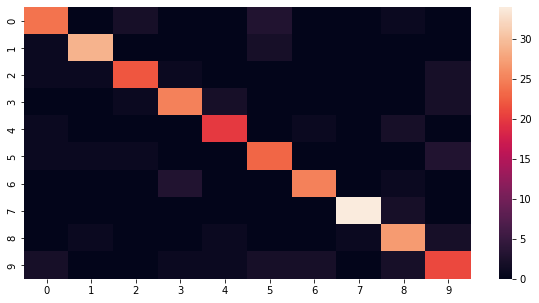

In [ ]:
# Final model
cbc = cb.CatBoostClassifier(verbose=0, eval_metric='Accuracy', loss_function='MultiClass')
cbc.fit(X_train, y_train)

preds = cbc.predict(X_test)

print('Accuracy', ':', round(accuracy_score(y_test, preds), 5), '\n')

# Confusion Matrix
confus_mat = confusion_matrix(y_test, preds) 
plt.figure(figsize = (10, 5))
sns.heatmap(confus_mat)

#Deep learning model time

In [ ]:
X_train.shape[1]

58

In [ ]:
X_train.shape

(700, 58)

In [ ]:
model = Sequential()

model.add(Flatten(input_shape=(58,)))
model.add(Dense(512, activation='relu', kernel_regularizer = keras.regularizers.l2(0.001)))
model.add(Dropout(0.3))
model.add(Dense(256, activation='relu', kernel_regularizer = keras.regularizers.l2(0.003)))
model.add(Dropout(0.3))
model.add(Dense(64, activation='relu', kernel_regularizer = keras.regularizers.l2(0.01)))
model.add(Dropout(0.3))
model.add(Dense(32, activation='relu'))
model.add(Dense(10, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 58)                0         
                                                                 
 dense (Dense)               (None, 512)               30208     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 64)                16448     
                                                                 
 dropout_2 (Dropout)         (None, 64)                0

In [ ]:
#In order to prevent our model from overfitting we wll use callbacks
early_stopping= EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=5) 
check_pointer = ModelCheckpoint(filepath = 'clf-resnet-checkpoint.hdf5',verbose=1,save_best_only=True) 
reduce_lr = ReduceLROnPlateau(monitor='val_loss',mode='min',verbose=1,patience=5,min_delta = 0.0001,factor=0.2) 
callbacks = [check_pointer,early_stopping,reduce_lr]


In [ ]:
# compile the model
adam = keras.optimizers.Adam(lr=1e-4)
model.compile(optimizer=adam,
             loss="sparse_categorical_crossentropy",
             metrics=["accuracy"])

In [ ]:
#Now our model is ready to train

hist = model.fit(X_train, y_train,
                 validation_data = (X_test,y_test),
                 epochs = 100,
                 batch_size = 32, callbacks = [check_pointer,early_stopping])

Epoch 1/100
14/22 [==================>...........] - ETA: 0s - loss: 4.4294 - accuracy: 0.0960 
Epoch 1: val_loss improved from inf to 4.35179, saving model to clf-resnet-checkpoint.hdf5
22/22 [==============================] - 1s 18ms/step - loss: 4.4091 - accuracy: 0.1043 - val_loss: 4.3518 - val_accuracy: 0.1200
Epoch 2/100
21/22 [===========================>..] - ETA: 0s - loss: 4.3160 - accuracy: 0.1205
Epoch 2: val_loss improved from 4.35179 to 4.25526, saving model to clf-resnet-checkpoint.hdf5
22/22 [==============================] - 0s 8ms/step - loss: 4.3151 - accuracy: 0.1171 - val_loss: 4.2553 - val_accuracy: 0.0933
Epoch 3/100
13/22 [================>.............] - ETA: 0s - loss: 4.2391 - accuracy: 0.1274
Epoch 3: val_loss improved from 4.25526 to 4.15947, saving model to clf-resnet-checkpoint.hdf5
22/22 [==============================] - 0s 7ms/step - loss: 4.2222 - accuracy: 0.1200 - val_loss: 4.1595 - val_accuracy: 0.1200
Epoch 4/100
13/22 [================>.........

In [ ]:
test_error, test_accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"Test accuracy: {test_accuracy}")

10/10 [==============================] - 0s 2ms/step - loss: 1.6405 - accuracy: 0.5900
Test accuracy: 0.5899999737739563


In [ ]:
# serialize model to JSON
model_json = model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("model.h5")
print("Saved model to disk")

##Plot Accuracy and Loss

<Figure size 1440x1080 with 0 Axes>

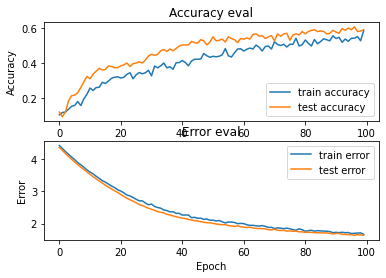

In [ ]:
plt.figure(figsize=(20,15))
fig, axs = plt.subplots(2)

# accuracy 
axs[0].plot(hist.history["accuracy"], label="train accuracy")
axs[0].plot(hist.history["val_accuracy"], label="test accuracy")    
axs[0].set_ylabel("Accuracy")
axs[0].legend(loc="lower right")
axs[0].set_title("Accuracy eval")
    
# Error 
axs[1].plot(hist.history["loss"], label="train error")
axs[1].plot(hist.history["val_loss"], label="test error")    
axs[1].set_ylabel("Error")
axs[1].set_xlabel("Epoch")
axs[1].legend(loc="upper right")
axs[1].set_title("Error eval")
    
plt.show()

# Создадим собственный датасет из нашей музыки !

##Создаем csv файл с нашими данными

In [ ]:
#Создаем Header для файла CSV
header = 'filename chroma_stft chroma_cqt chroma_cens melspectrogram rmse spectral_centroid spectral_bandwidth spectral_contrast rolloff tonnetz zero_crossing_rate'
for i in range(1, 21):
    header += f' mfcc{i}'
header += ' label'
header = header.split()

Извлекаем признаки из спектрограммы: MFCC, спектральный центроид, частоту пересечения нуля, частоты цветности и спад спектра.

In [ ]:
def checkFileInCsvWhenCreating(name):
  with open('/content/dataset.csv', 'r') as fp:
    s = fp.read()
    if name not in s:
      print(f"There is no {name} in dataset")
      return True
    else:
      return False

In [ ]:
%%time
file = open('dataset.csv', 'w+', newline='')
with file:
    writer = csv.writer(file)
    writer.writerow(header)

for g in genres_to_analyze:
    for filename in os.listdir(f'/content/drive/MyDrive/Colab Notebooks/ML/Course Work/Genres/{g}'):
        songname = f'/content/drive/MyDrive/Colab Notebooks/ML/Course Work/Genres/{g}/{filename}'
        filename = filename.replace(' ', '_')
        if (checkFileInCsvWhenCreating(filename)):
          y, sr = librosa.load(songname, mono=True)
          rmse = librosa.feature.rms(y=y)
          chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
          chroma_cqt = librosa.feature.chroma_cqt(y=y, sr=sr)
          chroma_cens = librosa.feature.chroma_cens(y=y, sr=sr)
          melspectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
          spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
          tonnetz = librosa.feature.tonnetz(y=y, sr=sr)
          tempogram = librosa.feature.tempogram(y=y, sr=sr)
          spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr)
          spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
          rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
          zcr = librosa.feature.zero_crossing_rate(y)
          mfcc = librosa.feature.mfcc(y=y, sr=sr)
          to_append = f'{filename} {np.mean(chroma_stft)} {np.mean(chroma_cqt)} {np.mean(chroma_cens)} {np.mean(melspectrogram)} {np.mean(rmse)} {np.mean(spec_cent)} {np.mean(spec_bw)} {np.mean(spectral_contrast)} {np.mean(rolloff)} {np.mean(tonnetz)} {np.mean(zcr)}'    
          for e in mfcc:
              to_append += f' {np.mean(e)}'
          to_append += f' {g}'
          file = open('dataset.csv', 'a', newline='')
          with file:
              writer = csv.writer(file)
              writer.writerow(to_append.split())

CPU times: user 2h 53min 27s, sys: 6min 41s, total: 3h 8s
Wall time: 2h 59min 50s


Вот что мы получаем

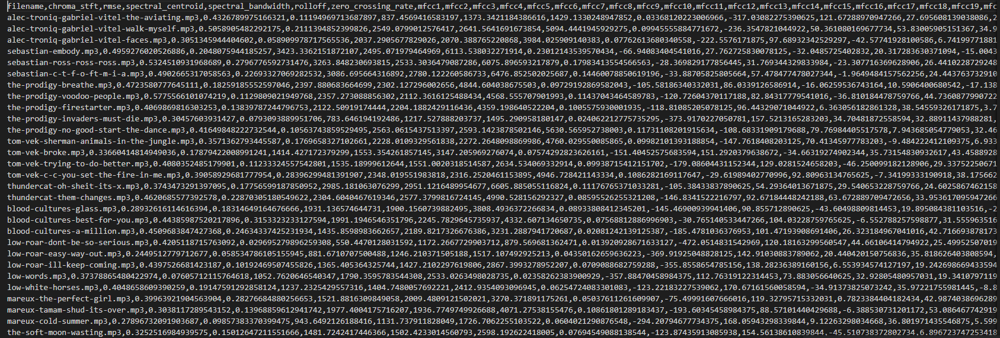

## ❗ Дополняем csv файл новыми данными ⛔

In [ ]:
def checkFileInCsv(name):
  with open('/content/dataset.csv', 'r') as fp:
    s = fp.read()
    if name not in s:
      print(f"There is no {name} in dataset")
      return True
    else:
      return False

In [ ]:
for g in genres_to_analyze:
    for filename in os.listdir(f'/content/drive/MyDrive/Colab Notebooks/ML/Course Work/Genres/{g}'):
        songname = f'/content/drive/MyDrive/Colab Notebooks/ML/Course Work/Genres/{g}/{filename}'
        filename = filename.replace(' ', '_')
        if (checkFileInCsv(filename)):
          y, sr = librosa.load(songname, mono=True)
          rmse = librosa.feature.rms(y=y)
          chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
          chroma_cqt = librosa.feature.chroma_cqt(y=y, sr=sr)
          chroma_cens = librosa.feature.chroma_cens(y=y, sr=sr)
          melspectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
          spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
          tonnetz = librosa.feature.tonnetz(y=y, sr=sr)
          tempogram = librosa.feature.tempogram(y=y, sr=sr)
          spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr)
          spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
          rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
          zcr = librosa.feature.zero_crossing_rate(y)
          mfcc = librosa.feature.mfcc(y=y, sr=sr)
          to_append = f'{filename} {np.mean(chroma_stft)} {np.mean(chroma_cqt)} {np.mean(chroma_cens)} {np.mean(melspectrogram)} {np.mean(rmse)} {np.mean(spec_cent)} {np.mean(spec_bw)} {np.mean(spectral_contrast)} {np.mean(rolloff)} {np.mean(tonnetz)} {np.mean(zcr)}'    
          for e in mfcc:
              to_append += f' {np.mean(e)}'
          to_append += f' {g}'
          file = open('dataset.csv', 'a', newline='')
          with file:
              writer = csv.writer(file)
              writer.writerow(to_append.split())

#Splitting

Выполняем предварительную обработку данных, которая включает загрузку данных CSV, создание меток, масштабирование признаков и разбивку данных на наборы для обучения и тестирования.

In [ ]:
%%time

data = pd.read_csv('dataset.csv')
data.head()

temp = ((data.index[data["filename"]=='something_against_u+us.mp3'].tolist())[0])

# Удаление ненужных столбцов
data = data.drop(['filename'],axis=1)
# Создание меток
genre_list = data.iloc[:, -1]
encoder = preprocessing.LabelEncoder()
y = encoder.fit_transform(genre_list)
# Масштабирование столбцов признаков
scaler = preprocessing.StandardScaler()
X = scaler.fit_transform(np.array(data.iloc[:, :-1], dtype = float))


fire=np.array(X[3], ndmin=2)
print(fire)

# Разделение данных на обучающий и тестовый набор
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

#WITH STRATIFY
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) 

#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=genre_list) 


X_train.shape, X_test.shape, y_train.shape, y_test.shape

[[-1.89160393  0.11220828 -0.32043399 -0.78839399 -0.88600181 -2.27331186
  -3.18309816  0.457209   -2.39955572 -1.8124071  -1.50621836 -2.1032274
   2.68261181  2.03151405 -1.63058912  1.04982758 -1.74248899 -0.20585799
  -2.5881632  -1.41340406 -2.67933863 -0.11932958 -2.41541609 -1.36265149
  -3.64482143 -1.89447003 -3.12962138  0.13207931 -1.5924601   1.16452738
   0.82804021]]
CPU times: user 20.6 ms, sys: 4.97 ms, total: 25.6 ms
Wall time: 85 ms


((178, 31), (77, 31), (178,), (77,))

## Some unnecessary info

In [ ]:
genre_list

0              lo-fi
1              lo-fi
2              lo-fi
3              lo-fi
4              lo-fi
           ...      
250    Dungeon_Synth
251    Dungeon_Synth
252    Dungeon_Synth
253    Dungeon_Synth
254    Dungeon_Synth
Name: label, Length: 255, dtype: object

In [ ]:
y

array([13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13,
       13, 13, 13, 13, 13, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11,
       11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
        2,  2,  2,  2,  6,  6,  6,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
        8,  8, 10, 10, 10, 10, 10,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,
        7,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,
        9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, 14, 14, 14, 14,
       14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14,
       14, 14, 14,  0,  0

In [ ]:
data = pd.read_csv('dataset.csv')
fin=data.loc[data['filename'] == "kylie-minogue-mum-whistle.mp3"]
fin = fin.drop(['filename'],axis=1)
fin

,chroma_stft,chroma_cqt,chroma_cens,melspectrogram,rmse,spectral_centroid,spectral_bandwidth,spectral_contrast,rolloff,tonnetz,...,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label
225,0.323326,0.341339,0.21658,7.961779,0.15988,1661.620063,1941.408515,25.363029,3424.266985,0.044541,...,1.047687,-5.772095,2.705143,-4.538064,1.142767,-6.823021,4.336217,-2.8343,-0.332673,Ambient


In [ ]:
scaler = preprocessing.StandardScaler()
res=(np.array(fin.iloc[:, :-1], dtype = float))
res

array([[ 3.23325962e-01,  3.41338664e-01,  2.16580134e-01,
         7.96177864e+00,  1.59880087e-01,  1.66162006e+03,
         1.94140852e+03,  2.53630286e+01,  3.42426699e+03,
         4.45411345e-02,  7.46896401e-02, -1.42378250e+02,
         1.17263145e+02, -1.40796986e+01,  3.28594666e+01,
        -3.37800193e+00,  2.30973530e+00,  4.29088783e+00,
         2.09662747e+00, -1.86625016e+00, -1.71236321e-01,
        -9.18078899e+00,  1.04768717e+00, -5.77209520e+00,
         2.70514297e+00, -4.53806400e+00,  1.14276683e+00,
        -6.82302141e+00,  4.33621693e+00, -2.83430028e+00,
        -3.32673073e-01]])

In [ ]:
X

array([[ 2.71421044, -0.17999325, -0.82252662, ..., -0.77898168,
         1.88825389, -0.17580654],
       [-0.36933294,  0.03580265,  0.23595456, ..., -1.93825594,
         0.10406898, -1.99791736],
       [ 0.59646364,  1.68119774,  1.06972382, ..., -0.72005672,
         1.51380944, -0.50887851],
       ...,
       [-1.24862463, -0.72917626, -1.17597554, ..., -1.36883151,
        -2.92530405, -0.65025782],
       [-0.91411627, -0.10761519, -0.47570706, ..., -2.12359289,
        -0.14640298, -1.86329561],
       [-2.44838398, -1.91827171, -2.72216355, ..., -1.53311693,
        -4.35105899, -2.00278606]])

In [ ]:
X_test

array([[ 1.47833596,  0.8761511 ,  0.87848863, ...,  0.63056219,
         0.38881261,  0.10785073],
       [-0.11647175,  0.09328939,  0.63613631, ...,  0.91076614,
        -1.00818637,  0.23539746],
       [-1.27170197, -1.2917367 , -1.67176086, ..., -1.48051332,
         0.07838249,  0.80076994],
       ...,
       [ 1.7199719 ,  0.89119766,  0.90036046, ...,  1.25289105,
         0.31807624,  0.79672511],
       [ 0.2576359 ,  1.96756198,  1.2436761 , ..., -0.08481413,
        -0.25803489,  0.09918033],
       [ 0.61523459,  1.07784746,  0.78919925, ..., -0.10642541,
         1.42869201, -0.1451101 ]])

# Nerual Nettworks

##Создаем модель ANN

In [ ]:
model = Sequential()
model.add(keras.layers.Dense(256, activation='relu', input_shape=(X_train.shape[1],)))
model.add(keras.layers.Dense(128, activation='relu'))
model.add(keras.layers.Dense(64, activation='relu'))
model.add(keras.layers.Dense(15, activation='softmax'))
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
#Вставляем в нашу модель данные
%%time
classifier = model.fit(X_train,
                    y_train,
                    epochs=100,
                    batch_size=128)

Epoch 1/100
2/2 [==============================] - 1s 12ms/step - loss: 2.6879 - accuracy: 0.1079
Epoch 2/100
2/2 [==============================] - 0s 7ms/step - loss: 2.5544 - accuracy: 0.2158
Epoch 3/100
2/2 [==============================] - 0s 8ms/step - loss: 2.4664 - accuracy: 0.2878
Epoch 4/100
2/2 [==============================] - 0s 7ms/step - loss: 2.3904 - accuracy: 0.3165
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 2.3204 - accuracy: 0.3237
Epoch 6/100
2/2 [==============================] - 0s 7ms/step - loss: 2.2589 - accuracy: 0.3094
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 2.2033 - accuracy: 0.2878
Epoch 8/100
2/2 [==============================] - 0s 7ms/step - loss: 2.1567 - accuracy: 0.3022
Epoch 9/100
2/2 [==============================] - 0s 7ms/step - loss: 2.1172 - accuracy: 0.3309
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 2.0736 - accuracy: 0.3669
Epoch 11/100
2/2 [==========

<Figure size 1440x1080 with 0 Axes>

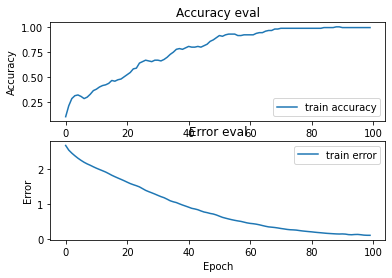

In [ ]:
plt.figure(figsize=(20,15))
fig, axs = plt.subplots(2)

# accuracy 
axs[0].plot(classifier.history["accuracy"], label="train accuracy")
#axs[0].plot(classifier.history["val_accuracy"], label="test accuracy")    
axs[0].set_ylabel("Accuracy")
axs[0].legend(loc="lower right")
axs[0].set_title("Accuracy eval")
    
# Error 
axs[1].plot(classifier.history["loss"], label="train error")
#axs[1].plot(classifier.history["val_loss"], label="test error")    
axs[1].set_ylabel("Error")
axs[1].set_xlabel("Epoch")
axs[1].legend(loc="upper right")
axs[1].set_title("Error eval")
    
plt.show()

##Создаем спектрограмму для наших песен

In [ ]:
for g in genres_to_analyze:
    pathlib.Path(f'img_data/{g}').mkdir(parents=True, exist_ok=True)
    for filename in os.listdir(f'/content/drive/MyDrive/Colab Notebooks/ML/Course Work/Genres/{g}'):
        songname = f'/content/drive/MyDrive/Colab Notebooks/ML/Course Work/Genres/{g}/{filename}'
        y, sr = librosa.load(songname, mono=True, duration=120)
        print(y.shape)
        plt.specgram(y, NFFT=2048, Fs=2, Fc=0, noverlap=128, cmap=cmap, sides='default', mode='default', scale='dB');
        plt.axis('off');
        plt.savefig(f'img_data/{g}/{filename[:-3].replace(".", "")}.png')
        
        plt.clf()

(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)
(110250,)


KeyboardInterrupt: ignored

<Figure size 432x288 with 0 Axes>

##Попытка использовать тенсерфлоу

https://nuancesprog.ru/p/6758/

In [ ]:
!pip install split-folders

In [ ]:
import splitfolders
# Для создания наборов для обучения и тестирования устанавливаем кортеж в `ratio`, т.е., `(.8, .2)`.
splitfolders.ratio('./img_data/', output="./data", seed=1337, ratio=(.8, .2)) # значения по умолчанию

Copying files: 131 files [00:00, 3547.50 files/s]


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
        rescale=1./255, # изменение масштаба всех значений пикселей с 0 до 255, после этого шага они будут находится в диапазоне (0,1)
        shear_range=0.2, # применение случайных преобразований
        zoom_range=0.2, # увеличение масштаба
        horizontal_flip=True) # горизонтальный поворот
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
training_set = train_datagen.flow_from_directory(
        './data/train',
        target_size=(64, 64),
        batch_size=32,
        class_mode='categorical',
        shuffle = False)
test_set = test_datagen.flow_from_directory(
        './data/val',
        target_size=(64, 64),
        batch_size=32,
        class_mode='categorical',
        shuffle = False )

Found 101 images belonging to 7 classes.
Found 30 images belonging to 7 classes.


In [ ]:
model = Sequential()
input_shape=(64, 64, 3)#1st hidden layer
model.add(Conv2D(32, (3, 3), strides=(2, 2), input_shape=input_shape))
model.add(AveragePooling2D((2, 2), strides=(2,2)))
model.add(Activation('leakyrelu'))#2nd hidden layer
model.add(Conv2D(64, (3, 3), padding="same"))
model.add(AveragePooling2D((2, 2), strides=(2,2)))
model.add(Activation('relu'))#3rd hidden layer
model.add(Conv2D(64, (3, 3), padding="same"))
model.add(AveragePooling2D((2, 2), strides=(2,2)))
model.add(Activation('relu'))#Flatten
model.add(Flatten())
model.add(Dropout(rate=0.5))#Add fully connected layer.
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(rate=0.5))#Output layer
model.add(Dense(7))
model.add(Activation('softmax'))
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 31, 31, 32)        896       
                                                                 
 average_pooling2d_6 (Averag  (None, 15, 15, 32)       0         
 ePooling2D)                                                     
                                                                 
 activation_10 (Activation)  (None, 15, 15, 32)        0         
                                                                 
 conv2d_7 (Conv2D)           (None, 15, 15, 64)        18496     
                                                                 
 average_pooling2d_7 (Averag  (None, 7, 7, 64)         0         
 ePooling2D)                                                     
                                                                 
 activation_11 (Activation)  (None, 7, 7, 64)         

In [ ]:
from tensorflow.keras.optimizers import SGD
epochs = 200
batch_size = 8
learning_rate = 0.01
decay_rate = learning_rate / epochs
momentum = 0.9
sgd = SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
model.compile(optimizer="sgd", loss="categorical_crossentropy", metrics=['accuracy'])

In [ ]:
model.fit_generator(
        training_set,
        #steps_per_epoch=50,
        epochs=200,
        validation_data=test_set,
        #validation_steps=200
        )

Epoch 1/200
4/4 [==============================] - 1s 350ms/step - loss: 1.7843 - accuracy: 0.2277 - val_loss: 1.8136 - val_accuracy: 0.1667
Epoch 2/200
4/4 [==============================] - 2s 387ms/step - loss: 1.8220 - accuracy: 0.2277 - val_loss: 1.8131 - val_accuracy: 0.1667
Epoch 3/200
4/4 [==============================] - 1s 246ms/step - loss: 1.8498 - accuracy: 0.1782 - val_loss: 1.8116 - val_accuracy: 0.1667
Epoch 4/200
4/4 [==============================] - 1s 245ms/step - loss: 1.7902 - accuracy: 0.2277 - val_loss: 1.8138 - val_accuracy: 0.1667
Epoch 5/200
4/4 [==============================] - 1s 318ms/step - loss: 1.8333 - accuracy: 0.1881 - val_loss: 1.8148 - val_accuracy: 0.1667
Epoch 6/200
4/4 [==============================] - 1s 232ms/step - loss: 1.8287 - accuracy: 0.2673 - val_loss: 1.8156 - val_accuracy: 0.1667
Epoch 7/200
4/4 [==============================] - 1s 232ms/step - loss: 1.8051 - accuracy: 0.2178 - val_loss: 1.8173 - val_accuracy: 0.1667
Epoch 8/200
4

In [ ]:
model.evaluate_generator(generator=test_set, steps=200)

[1.7840908765792847, 0.1666666716337204]

In [ ]:
test_set.reset()
pred = model.predict_generator(test_set, steps=200, verbose=1)

50/50 [==============================] - 0s 626us/step


In [ ]:
predicted_class_indices=np.argmax(pred,axis=1)

labels = (training_set.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = [labels[k] for k in predicted_class_indices]
predictions = predictions[:200]
filenames=test_set.filenames

In [ ]:
results=pd.DataFrame({"Filename":filenames,
                      "Predictions":predictions})
results.to_csv("prediction_results.csv",index=False)

In [ ]:
print(X_train.shape)

(104, 26)


#Посмотрим на точность разных моделей обучения

In [ ]:
def model_assess(model, title = "Default"):
  model.fit(X_train, y_train)
  preds = model.predict(X_test)
  #print(confusion_matrix(y_test, preds))
  print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')

In [ ]:
%%time
# Naive Bayes
nb = GaussianNB()
model_assess(nb, "Naive Bayes")

Accuracy Naive Bayes : 0.25974 

CPU times: user 13.7 ms, sys: 960 µs, total: 14.7 ms
Wall time: 14 ms


In [ ]:
%%time
# Stochastic Gradient Descent
sgd = SGDClassifier(max_iter=5000, random_state=0)
model_assess(sgd, "Stochastic Gradient Descent")

Accuracy Stochastic Gradient Descent : 0.18182 

CPU times: user 35.6 ms, sys: 1.94 ms, total: 37.5 ms
Wall time: 58.1 ms


In [ ]:
%%time
# KNN
knn = KNeighborsClassifier(n_neighbors=19)
model_assess(knn, "KNN")

Accuracy KNN : 0.25974 

CPU times: user 12.1 ms, sys: 6.94 ms, total: 19 ms
Wall time: 13.8 ms


In [ ]:
%%time
# Decission trees
tree = DecisionTreeClassifier()
model_assess(tree, "Decission trees")

Accuracy Decission trees : 0.20779 

CPU times: user 19.7 ms, sys: 23.9 ms, total: 43.6 ms
Wall time: 31.7 ms


In [ ]:
%%time
# Random Forest
rforest = RandomForestClassifier(n_estimators=300, max_depth=20, random_state=0)
model_assess(rforest, "Random Forest")

Accuracy Random Forest : 0.32468 

CPU times: user 627 ms, sys: 53.5 ms, total: 680 ms
Wall time: 639 ms


In [ ]:
%%time
# catboost
cbc = cb.CatBoostClassifier(verbose=0, eval_metric='Accuracy', loss_function='MultiClass')
model_assess(cbc,"Cat Boost Classifier")

Accuracy Cat Boost Classifier : 0.4026 

CPU times: user 1min 33s, sys: 677 ms, total: 1min 33s
Wall time: 51.1 s


In [ ]:
%%time
# Support Vector Machine
svm = SVC(decision_function_shape="ovo")
model_assess(svm, "Support Vector Machine")

Accuracy Support Vector Machine : 0.36364 

CPU times: user 15.9 ms, sys: 1.95 ms, total: 17.8 ms
Wall time: 23.9 ms


In [ ]:
%%time
# Logistic Regression
lg = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial')
model_assess(lg, "Logistic Regression")

Accuracy Logistic Regression : 0.24675 

CPU times: user 55.2 ms, sys: 3.98 ms, total: 59.2 ms
Wall time: 67 ms


In [ ]:
%%time
# Neural Nets
nn = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5000, 10), random_state=1)
model_assess(nn, "Neural Nets")

Accuracy Neural Nets : 0.31169 

CPU times: user 14.8 s, sys: 6.34 s, total: 21.1 s
Wall time: 11.6 s


In [ ]:
%%time
# Cross Gradient Booster
xgb = XGBClassifier(n_estimators=300, learning_rate=0.05)
model_assess(xgb, "Cross Gradient Booster")

Accuracy Cross Gradient Booster : 0.31169 

CPU times: user 1.31 s, sys: 107 ms, total: 1.41 s
Wall time: 1.51 s


In [ ]:
%%time
# Cross Gradient Booster (Random Forest)
xgbrf = XGBRFClassifier(objective= 'multi:softmax')
model_assess(xgbrf, "Cross Gradient Booster (Random Forest)")

Accuracy Cross Gradient Booster (Random Forest) : 0.28571 

CPU times: user 405 ms, sys: 5.95 ms, total: 411 ms
Wall time: 409 ms


get info from label encoder

In [ ]:
name_mapping = dict(zip(encoder.transform(encoder.classes_), encoder.classes_))
print(name_mapping)

{0: 'Ambient', 1: 'Dark_Wave', 2: 'Deep_house', 3: 'Dungeon_Synth', 4: 'Electronic_music', 5: 'Experimental_Electronic_music', 6: 'Industrial', 7: 'Metall', 8: 'My_Music', 9: 'New_Wave', 10: 'Old_Pop', 11: 'Rock', 12: 'Techno', 13: 'lo-fi', 14: 'synthwave'}


In [ ]:
list(dict.fromkeys(genre_list))

['lo-fi',
 'Rock',
 'Techno',
 'Experimental_Electronic_music',
 'Electronic_music',
 'Deep_house',
 'Industrial',
 'My_Music',
 'Old_Pop',
 'Metall',
 'New_Wave',
 'Dark_Wave',
 'synthwave',
 'Ambient',
 'Dungeon_Synth']

[ 8  5  8  8  8  5  9 13 14 10  8 14  3 13  9  9 13  9 14  3  8 14 13  8
  9  9  7  1  9  8  0 11  8  8  2  9  4  3  4  9  9 13 13 13  2  5  8 12
  8  1  7  3 10 14 11  8  8  2  9  0  0  8  9  3  8  8  3  4  0  6  8 14
  4  8  1  9  9]
Accuracy : 0.31169 

Your song sounds like this genre:  lo-fi
CPU times: user 2.4 s, sys: 65.3 ms, total: 2.47 s
Wall time: 2.49 s


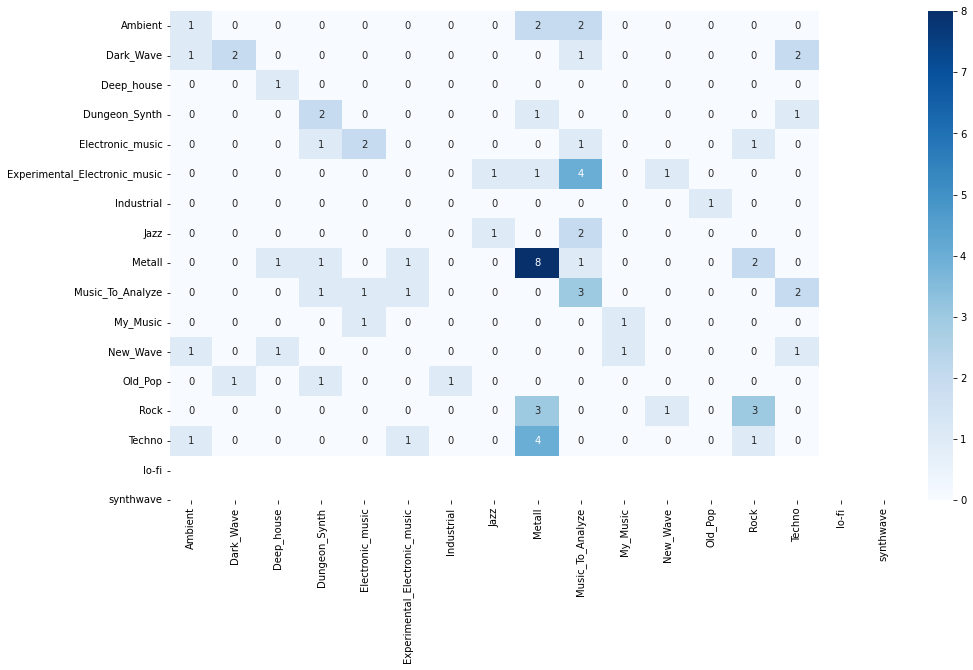

In [ ]:
# Final model
%%time
xgb = XGBClassifier(n_estimators=300, learning_rate=0.005) # SQR(n_est) (OR!) gridsearchCV 
xgb.fit(X_train, y_train)

preds = xgb.predict(X_test)
print(preds)

print('Accuracy', ':', round(accuracy_score(y_test, preds), 5), '\n')

var = (xgb.predict(fire)[0])
print("Your song sounds like this genre: ", name_mapping[var] )



# Confusion Matrix
confusion_matr = confusion_matrix(y_test, preds) #normalize = 'true'
plt.figure(figsize = (16, 9))
sns.heatmap(confusion_matr, cmap="Blues", annot=True, 
            xticklabels = ["Ambient", "Dark_Wave","Deep_house", "Dungeon_Synth", "Electronic_music","Experimental_Electronic_music","Industrial","Jazz","Metall","Music_To_Analyze","My_Music","New_Wave","Old_Pop","Rock","Techno","lo-fi","synthwave"],
           yticklabels=["Ambient", "Dark_Wave","Deep_house", "Dungeon_Synth", "Electronic_music","Experimental_Electronic_music","Industrial","Jazz","Metall","Music_To_Analyze","My_Music","New_Wave","Old_Pop","Rock","Techno","lo-fi","synthwave"]);
plt.savefig("conf matrix")

# Classification report

In [ ]:
print (classification_report (y_test, preds))

              precision    recall  f1-score   support

           0       0.25      0.20      0.22         5
           1       0.67      0.33      0.44         6
           2       0.33      1.00      0.50         1
           3       0.33      0.50      0.40         4
           4       0.50      0.40      0.44         5
           5       0.00      0.00      0.00         7
           6       0.00      0.00      0.00         1
           7       0.50      0.33      0.40         3
           8       0.42      0.57      0.48        14
           9       0.21      0.38      0.27         8
          10       0.50      0.50      0.50         2
          11       0.00      0.00      0.00         4
          12       0.00      0.00      0.00         3
          13       0.43      0.43      0.43         7
          14       0.00      0.00      0.00         7

    accuracy                           0.31        77
   macro avg       0.28      0.31      0.27        77
weighted avg       0.29   

#Using Optuna

## Optuna XGBoost

In [ ]:
def objective(trial,data=X,target=y):
    
    joblib.dump(study, 'study.pkl')


    train_x, test_x, train_y, test_y = train_test_split(data, target, test_size=0.25,random_state=42, stratify=y)
    kf = KFold(n_splits=10,random_state=42,shuffle=True)
    param = {
        'nthread':-1,
        'tree_method':'hist',  # this parameter means using the GPU when training our model to speedup the training process
        'num_parallel_tree':5,
        'n_estimators': 5000,
        'lambda': trial.suggest_float('lambda', 1e-5, 1.0),
        'alpha': trial.suggest_float('alpha', 1e-5, 1.0),
        'colsample_bytree': trial.suggest_categorical('colsample_bytree', np.arange(0.00000,1,0.00001)),
        'subsample': trial.suggest_float('subsample',  1e-5, 1.0),
        'learning_rate': trial.suggest_categorical('learning_rate', np.arange(0.00000,5.0,0.00001) ),
        'max_depth': trial.suggest_int('max_depth',2, 20),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 30),
        'gamma': trial.suggest_categorical('gamma', np.arange(0.00000,20.0,0.00005)),
        #'max_bin': 256*700,
        

    }
    model = XGBClassifier(**param)  
    
    model.fit(train_x,train_y,eval_set=[(test_x,test_y)],early_stopping_rounds=1000,verbose=False)
    
    preds = model.predict(test_x)
    
    rmse = mean_squared_error(test_y, preds,squared=False)
    
    return (model.score(test_x , test_y)) # (model.score(x_train , y_train))

In [ ]:
def logging_callback(study, frozen_trial):
    previous_best_value = study.user_attrs.get("previous_best_value", None)
    if previous_best_value != study.best_value:
        study.set_user_attr("previous_best_value", study.best_value)
        print(
            "\nWARNING\nTrial {} finished with best value: {} and parameters: {}.\n ".format(
            frozen_trial.number,
            frozen_trial.value,
            frozen_trial.params,
            )
        )

In [ ]:
if os.path.isfile('xgboost.pkl'):
    study = joblib.load('xgboost.pkl')
else:
    study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=400,
               show_progress_bar=True, n_jobs=-1, gc_after_trial=True,
               callbacks=[logging_callback])

[I 2022-10-15 06:41:21,902] A new study created in memory with name: no-name-3b572c6d-cbef-47cd-ace8-b9a150430a35


  0%|          | 0/400 [00:00<?, ?it/s]

[I 2022-10-15 06:42:04,820] Trial 1 finished with value: 0.171875 and parameters: {'lambda': 0.8851343908227188, 'alpha': 0.8517566613702034, 'colsample_bytree': 0.5177900000000001, 'subsample': 0.8883026460168935, 'learning_rate': 0.7045600000000001, 'max_depth': 10, 'min_child_weight': 13, 'gamma': 14.0335}. Best is trial 1 with value: 0.171875.

WARNING
Trial 1 finished with best value: 0.171875 and parameters: {'lambda': 0.8851343908227188, 'alpha': 0.8517566613702034, 'colsample_bytree': 0.5177900000000001, 'subsample': 0.8883026460168935, 'learning_rate': 0.7045600000000001, 'max_depth': 10, 'min_child_weight': 13, 'gamma': 14.0335}.
 
[I 2022-10-15 06:42:14,440] Trial 0 finished with value: 0.25 and parameters: {'lambda': 0.35351498343665366, 'alpha': 0.0020771923399497843, 'colsample_bytree': 0.16838, 'subsample': 0.5720609019804695, 'learning_rate': 3.4064400000000004, 'max_depth': 17, 'min_child_weight': 4, 'gamma': 17.08805}. Best is trial 0 with value: 0.25.
[I 2022-10-15 0

In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
optuna.visualization.plot_parallel_coordinate(study)

In [ ]:
optuna.visualization.plot_slice(study)

In [ ]:
print('Number of finished trials:', len(study.  trials))
print('Best trial:', study.best_trial.params)

In [ ]:
Best_trial = study.best_trial.params
Best_trial

In [ ]:
study.best_trial.value

In [ ]:
model = XGBClassifier()  

In [ ]:
model.set_params(**study.best_params)
model.fit(X, y)

## Optuna CatBoost

In [ ]:
def objective(trial,data=X,target=y):
    
    train_x, test_x, train_y, test_y = train_test_split(data, target, test_size=0.3,random_state=42, stratify=y)
    #kf = KFold(n_splits=10,random_state=42,shuffle=True)

    joblib.dump(study, 'catboost.pkl')

    param = {
        'loss_function': trial.suggest_categorical('loss_function',["MultiClass", "MultiClassOneVsAll"]), # CAN BE REMOVED
        'eval_metric':trial.suggest_categorical('eval_metric',["AUC", "WKappa", "Kappa", "ZeroOneLoss", "HammingLoss", "HingeLoss", "Accuracy", "MCC", "TotalF1"]), # CAN BE REMOVED 

        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf',1, 17),
        'bagging_temperature': trial.suggest_float('bagging_temperature',1.00001, 17), #CAN BE REMOVED
        'rsm': trial.suggest_float('rsm', 1e-6, 1.0), #CAN BE REMOVED
        'fold_permutation_block': trial.suggest_int('fold_permutation_block',1, 15),
        'leaf_estimation_iterations': trial.suggest_int('leaf_estimation_iterations',1, 12), #CAN BE REMOVED
        'learning_rate': trial.suggest_float('learning_rate', 1e-6,3),
        'reg_lambda': trial.suggest_float('reg_lambda', 1.0, 12), #CAN BE REMOVED
        'leaf_estimation_backtracking': trial.suggest_categorical('leaf_estimation_backtracking', ['No','AnyImprovement']),
        'depth': trial.suggest_int('depth',1, 16),
        'allow_const_label': trial.suggest_categorical('allow_const_label', [True, False]),
        'fold_len_multiplier': trial.suggest_float('fold_len_multiplier', 1, 12),
        'score_function': trial.suggest_categorical('score_function', ['Cosine', 'L2']),

        'boosting_type': trial.suggest_categorical('boosting_type', ['Ordered', 'Plain']),

        'langevin': trial.suggest_categorical('langevin', [True, False]),

        'auto_class_weights': trial.suggest_categorical('auto_class_weights', ['None','Balanced','SqrtBalanced']), 
        'iterations': trial.suggest_int('iterations', 1000, 7000),
        #"used_ram_limit": "12gb",
        #'max_bin': 10000,


        #TODO:

        #'auto_class_weights': trial.suggest_categorical('auto_class_weights', ['None','Balanced','SqrtBalanced']), class weights takes effect only with 
        #Logloss, MultiClass, MultiClassOneVsAll and user-defined loss functions
        ####

        #'subsample': trial.suggest_float('subsample', 0.1, 1.0-(1e-6)),
        #Error: default bootstrap type (bayesian) doesn't support taken fraction option
        ####

        #'approx_on_full_history': trial.suggest_categorical('approx_on_full_history', [True, False]),
        #Can't use approx-on-full-history with Plain boosting-type
        ####

        #param['diffusion_temperature']= trial.suggest_float('diffusion_temperature', 100_00.00000, 100_000.00000)

        ####
        #'score_function': trial.suggest_categorical('score_function', ['Cosine', 'L2']),

    }

    #ADDITIONAL SETTINGS

    if param["boosting_type"] == "Ordered":
      param['grow_policy']= 'SymmetricTree'
    

    if param["boosting_type"] == "Plain":
      param['grow_policy']= trial.suggest_categorical('grow_policy', ['SymmetricTree','Depthwise','Lossguide'])    


    if param["grow_policy"] != "Lossguide":
      param['sampling_frequency']= trial.suggest_categorical('sampling_frequency', ['PerTree','PerTreeLevel'])


    if param["langevin"]==True:
      param["posterior_sampling"] = trial.suggest_categorical('posterior_sampling', [True, False])
  
      if param["posterior_sampling"] == True:
        param['model_shrink_mode']= 'Constant'

      else:
        param['model_shrink_mode']= trial.suggest_categorical('model_shrink_mode', ['Constant', 'Decreasing'])


    #END OF SETTINGS

    print(param)
    model = cb.CatBoostClassifier(**param)  
    model.fit(train_x,train_y,eval_set=[(test_x,test_y)],early_stopping_rounds=200,verbose=False)
    
    #preds = model.predict(test_x)
    
    #rmse = mean_squared_error(test_y, preds,squared=False)
    #return (model.score(test_x , test_y))

    ### ANOTHER METHOD ###

    preds = model.predict(test_x)
    pred_labels = np.rint(preds)
    accuracy = accuracy_score(test_y, pred_labels) #OR ROC_AUG
    return accuracy

In [ ]:
def logging_callback(study, frozen_trial):
    previous_best_value = study.user_attrs.get("previous_best_value", None)
    if previous_best_value != study.best_value:
        study.set_user_attr("previous_best_value", study.best_value)
        print(
            "\nAHTUNG\nTrial {} finished with best value: {} and parameters: {}.\n ".format(
            frozen_trial.number,
            frozen_trial.value,
            frozen_trial.params,
            )
        )

In [ ]:
if os.path.isfile('catboost.pkl'):
  study = joblib.load('catboost.pkl')
else:
  sampler = optuna.samplers.TPESampler(multivariate=True)
  study = optuna.create_study(direction='maximize', sampler=sampler)

study.optimize(objective, n_trials=500, gc_after_trial=True,
              show_progress_bar=True, n_jobs=-1, callbacks=[logging_callback],catch=(CatBoostError, ValueError))

[I 2022-10-19 16:47:16,433] A new study created in memory with name: no-name-cdfd4ce6-8619-4ba9-a820-078bad3b8b90


  0%|          | 0/500 [00:00<?, ?it/s]

{'loss_function': 'MultiClass', 'eval_metric': 'Accuracy', 'min_data_in_leaf': 5, 'bagging_temperature': 8.048467438313143, 'rsm': 0.8893425758351714, 'fold_permutation_block': 15, 'leaf_estimation_iterations': 7, 'learning_rate': 0.9833753429614356, 'reg_lambda': 1.7689339001822675, 'leaf_estimation_backtracking': 'No', 'depth': 8, 'allow_const_label': False, 'fold_len_multiplier': 1.959174017318095, 'score_function': 'L2', 'boosting_type': 'Ordered', 'langevin': False, 'auto_class_weights': 'Balanced', 'iterations': 2144, 'grow_policy': 'SymmetricTree', 'sampling_frequency': 'PerTree'}
{'loss_function': 'MultiClassOneVsAll', 'eval_metric': 'Kappa', 'min_data_in_leaf': 5, 'bagging_temperature': 9.432376398117084, 'rsm': 0.2760071627322782, 'fold_permutation_block': 4, 'leaf_estimation_iterations': 4, 'learning_rate': 0.46905785694749325, 'reg_lambda': 2.332951447372904, 'leaf_estimation_backtracking': 'No', 'depth': 15, 'allow_const_label': False, 'fold_len_multiplier': 2.996628421028

In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
optuna.visualization.plot_parallel_coordinate(study)

In [ ]:
optuna.visualization.plot_slice(study)

In [ ]:
print('Number of finished trials:', len(study.  trials))
print('Best trial:', study.best_trial.params)

In [ ]:
Best_trial = study.best_trial.params
Best_trial

In [ ]:
study.best_trial.value

In [ ]:
model = cb.CatBoostClassifier()  

In [ ]:
model.set_params(**study.best_params)
model.fit(X, y)

# Feature Selection

https://machinelearningmastery.com/feature-importance-and-feature-selection-with-xgboost-in-python/


https://mljar.com/blog/feature-importance-xgboost/

#Теперь попробуем получить результат из нашего датасета

In [ ]:
# Read data
data = pd.read_csv(f'dataset.csv', index_col='filename')

# Extract labels
labels = data[['label']]

# Drop labels from original dataframe
data = data.drop(columns=['label'])
data.head()

# Scale the data
data_scaled=preprocessing.scale(data)
print('Scaled data type:', type(data_scaled))

Scaled data type: <class 'numpy.ndarray'>


In [ ]:
# Cosine similarity
%%time
similarity = cosine_similarity(data_scaled)
print("Similarity shape:", similarity.shape)

# Convert into a dataframe and then set the row index and column names as labels
sim_df_labels = pd.DataFrame(similarity)
sim_df_names = sim_df_labels.set_index(labels.index)
sim_df_names.columns = labels.index

sim_df_names.head()


Similarity shape: (199, 199)
CPU times: user 2.89 ms, sys: 6.95 ms, total: 9.84 ms
Wall time: 11.8 ms


In [ ]:
def find_similar_songs(name):
    # Find songs most similar to another song
    series = sim_df_names[name].sort_values(ascending = False)
    
    # Remove cosine similarity == 1 (songs will always have the best match with themselves)
    series = series.drop(name)
    
    # Display the 5 top matches 
    print("\n*******\nSimilar songs to ", name)
    print(series.head(5))
    print (series)
  

In [ ]:
%%time
find_similar_songs('светлана-разина-музыка-нас-связала.mp3') 

#ipd.Audio(f'{general_path}/genres_original/pop/pop.00019.wav')


*******
Similar songs to  светлана-разина-музыка-нас-связала.mp3
filename
lcd-soundsystem-daft-punk-is-playing-at-my-house.mp3    0.900457
mortiis-the-great-leap.mp3                              0.848690
sebastian-ross-ross-ross.mp3                            0.818958
soulwax-any-minute-now.mp3                              0.817395
Eshi.mp3                                                0.789758
Name: светлана-разина-музыка-нас-связала.mp3, dtype: float64
filename
lcd-soundsystem-daft-punk-is-playing-at-my-house.mp3    0.900457
mortiis-the-great-leap.mp3                              0.848690
sebastian-ross-ross-ross.mp3                            0.818958
soulwax-any-minute-now.mp3                              0.817395
Eshi.mp3                                                0.789758
                                                          ...   
god-is-an-astronaut-forever-lost.mp3                   -0.661729
metronomy-the-bay.mp3                                  -0.672385
lik.mp3   